In [277]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [278]:
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [279]:
from datetime import datetime, timedelta
# for file and folder operations
import os
# for regular expression opeations
import re
# for listing files in a folder
import glob
# for getting web contents
import requests 
# storing and analysing data
import pandas as pd
# for scraping web contents
from bs4 import BeautifulSoup
# to download data
import urllib.request

In [5]:
confirmed = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
death = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recovered = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')

In [6]:
confirmed.head(5)

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,47072,47306,47516,47716,47851,48053,48116,48229,48527,48718
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,42148,42988,43683,44436,45188,46061,46863,47742,48530,49191
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,87502,88252,88825,89416,90014,90579,91121,91638,92102,92597
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,7005,7050,7084,7127,7162,7190,7236,7288,7338,7382
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,15536,15591,15648,15729,15804,15925,16061,16161,16188,16277


In [7]:
death.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,1864,1874,1900,1906,1919,1935,1945,1956,1965,1969
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,889,905,922,936,951,965,977,989,1003,1016
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,2501,2516,2527,2539,2554,2564,2575,2584,2596,2609
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,78,78,78,78,78,78,78,78,79,79
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,354,354,354,355,358,362,365,366,371,372


In [8]:
recovered.head()

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,...,12/5/20,12/6/20,12/7/20,12/8/20,12/9/20,12/10/20,12/11/20,12/12/20,12/13/20,12/14/20
0,NaN,Afghanistan,33.93911,67.709953,0,0,0,0,0,0,...,37393,37685,37879,37920,38032,38099,38141,38200,38250,38252
1,NaN,Albania,41.15330,20.168300,0,0,0,0,0,0,...,21286,21617,22180,22527,23072,23609,24136,24520,24820,24820
2,NaN,Algeria,28.03390,1.659600,0,0,0,0,0,0,...,56617,57146,57648,58146,58146,59135,59590,60028,60457,60888
3,NaN,Andorra,42.50630,1.521800,0,0,0,0,0,0,...,6171,6238,6293,6367,6452,6505,6598,6629,6629,6706
4,NaN,Angola,-11.20270,17.873900,0,0,0,0,0,0,...,8335,8338,8353,8470,8579,8679,8798,8841,8898,8924


In [9]:
dates = confirmed.columns[4:]

In [10]:
confirmed = confirmed.melt(id_vars=['Province/State','Country/Region','Lat','Long'], 
                           value_vars = dates, var_name='Date',value_name='Confirmed')
death = death.melt(id_vars=['Province/State','Country/Region','Lat','Long'], 
                           value_vars = dates, var_name='Date',value_name='Death')
recovered = recovered.melt(id_vars=['Province/State','Country/Region','Lat','Long'], 
                           value_vars = dates, var_name='Date',value_name='Recovered')

In [11]:
confirmed.head(3)

,Province/State,Country/Region,Lat,Long,Date,Confirmed
0,NaN,Afghanistan,33.93911,67.709953,1/22/20,0
1,NaN,Albania,41.15330,20.168300,1/22/20,0
2,NaN,Algeria,28.03390,1.659600,1/22/20,0


In [12]:
recovered = recovered[recovered['Country/Region']!='Canada']

In [13]:
fulltable = pd.merge(left=confirmed, right=death, how='left',
                      on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long'])
fulltable = pd.merge(left=fulltable, right=recovered, how='left',
                      on=['Province/State', 'Country/Region', 'Date', 'Lat', 'Long'])

In [14]:
fulltable.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Death,Recovered
0,NaN,Afghanistan,33.93911,67.709953,1/22/20,0,0,0.0
1,NaN,Albania,41.15330,20.168300,1/22/20,0,0,0.0
2,NaN,Algeria,28.03390,1.659600,1/22/20,0,0,0.0
3,NaN,Andorra,42.50630,1.521800,1/22/20,0,0,0.0
4,NaN,Angola,-11.20270,17.873900,1/22/20,0,0,0.0


In [15]:
fulltable['Date']=pd.to_datetime(fulltable['Date'])

In [64]:
type(fulltable['Date'][0])

pandas._libs.tslibs.timestamps.Timestamp

In [16]:
fulltable['Death'] = fulltable['Death'].fillna(0)

In [17]:
fulltable['Recovered'] = fulltable['Recovered'].fillna(0)

In [18]:
fulltable['Death'] = fulltable['Death'].astype('int')

In [19]:
fulltable['Recovered'] = fulltable['Recovered'].astype('int')

In [20]:
fulltable.sample(4)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Death,Recovered
60356,NaN,New Zealand,-40.9006,174.8860,2020-08-31,1752,22,1598
4883,NaN,Antigua and Barbuda,17.0608,-61.7964,2020-02-09,0,0,0
9463,NaN,Ukraine,48.3794,31.1656,2020-02-25,0,0,0
45905,NaN,Dominica,15.4150,-61.3710,2020-07-09,18,0,18


In [21]:
fulltable.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Death,Recovered
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0


In [22]:
print(fulltable[fulltable['Country/Region']=='Albania'])

      Province/State Country/Region      Lat     Long       Date  Confirmed  \
1                NaN        Albania  41.1533  20.1683 2020-01-22          0   
272              NaN        Albania  41.1533  20.1683 2020-01-23          0   
543              NaN        Albania  41.1533  20.1683 2020-01-24          0   
814              NaN        Albania  41.1533  20.1683 2020-01-25          0   
1085             NaN        Albania  41.1533  20.1683 2020-01-26          0   
...              ...            ...      ...      ...        ...        ...   
87534            NaN        Albania  41.1533  20.1683 2020-12-10      46061   
87805            NaN        Albania  41.1533  20.1683 2020-12-11      46863   
88076            NaN        Albania  41.1533  20.1683 2020-12-12      47742   
88347            NaN        Albania  41.1533  20.1683 2020-12-13      48530   
88618            NaN        Albania  41.1533  20.1683 2020-12-14      49191   

       Death  Recovered  
1          0          0  

In [23]:
fulltable['Active'] = fulltable['Confirmed']-fulltable['Death']-fulltable['Recovered']

In [24]:
fulltable.rename(columns={'Death':'Deaths'},inplace=True)

In [25]:
fulltable.head()

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,NaN,Afghanistan,33.93911,67.709953,2020-01-22,0,0,0,0
1,NaN,Albania,41.15330,20.168300,2020-01-22,0,0,0,0
2,NaN,Algeria,28.03390,1.659600,2020-01-22,0,0,0,0
3,NaN,Andorra,42.50630,1.521800,2020-01-22,0,0,0,0
4,NaN,Angola,-11.20270,17.873900,2020-01-22,0,0,0,0


In [26]:
fulltable

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
0,NaN,Afghanistan,33.939110,67.709953,2020-01-22,0,0,0,0
1,NaN,Albania,41.153300,20.168300,2020-01-22,0,0,0,0
2,NaN,Algeria,28.033900,1.659600,2020-01-22,0,0,0,0
3,NaN,Andorra,42.506300,1.521800,2020-01-22,0,0,0,0
4,NaN,Angola,-11.202700,17.873900,2020-01-22,0,0,0,0
...,...,...,...,...,...,...,...,...,...
88883,NaN,Vietnam,14.058324,108.277199,2020-12-14,1402,35,1246,121
88884,NaN,West Bank and Gaza,31.952200,35.233200,2020-12-14,111102,1000,87057,23045
88885,NaN,Yemen,15.552727,48.516388,2020-12-14,2084,606,1384,94
88886,NaN,Zambia,-13.133897,27.849332,2020-12-14,18322,367,17409,546


In [27]:
fulltable = fulltable[fulltable['Province/State'].str.contains(',')!=True]

In [28]:
fulltable['Province/State'] = fulltable['Province/State'].fillna('')

C:\Users\jahna\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


In [29]:
fulltable.sample(5)

,Province/State,Country/Region,Lat,Long,Date,Confirmed,Deaths,Recovered,Active
24084,,Switzerland,46.8182,8.2275,2020-04-19,27740,1393,17800,8547
17963,Liaoning,China,41.2956,122.6085,2020-03-28,132,2,124,6
17677,Gansu,China,35.7518,104.2861,2020-03-27,136,2,123,11
8645,,Trinidad and Tobago,10.6918,-61.2225,2020-02-22,0,0,0,0
84730,,Mauritania,21.0079,-10.9408,2020-11-29,8547,175,7717,655


In [30]:
fullgroup = fulltable.groupby(['Date', 'Country/Region'])['Confirmed', 'Deaths', 'Recovered', 'Active'].sum().reset_index()

C:\Users\jahna\anaconda3\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  """Entry point for launching an IPython kernel.


In [62]:
fullgroup.head(10)

,Date,Country/Region,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,0,0,0,0
1,2020-01-22,Albania,0,0,0,0
2,2020-01-22,Algeria,0,0,0,0
3,2020-01-22,Andorra,0,0,0,0
4,2020-01-22,Angola,0,0,0,0
5,2020-01-22,Antigua and Barbuda,0,0,0,0
6,2020-01-22,Argentina,0,0,0,0
7,2020-01-22,Armenia,0,0,0,0
8,2020-01-22,Australia,0,0,0,0
9,2020-01-22,Austria,0,0,0,0


In [32]:
fullgroup

,Date,Country/Region,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,0,0,0,0
1,2020-01-22,Albania,0,0,0,0
2,2020-01-22,Algeria,0,0,0,0
3,2020-01-22,Andorra,0,0,0,0
4,2020-01-22,Angola,0,0,0,0
...,...,...,...,...,...,...
62643,2020-12-14,Vietnam,1402,35,1246,121
62644,2020-12-14,West Bank and Gaza,111102,1000,87057,23045
62645,2020-12-14,Yemen,2084,606,1384,94
62646,2020-12-14,Zambia,18322,367,17409,546


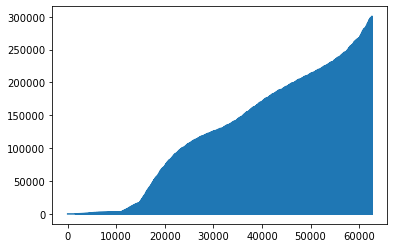

In [33]:
fullgroup['Deaths'].plot()

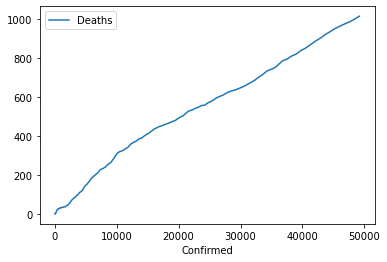

In [34]:
fullgroup[fullgroup['Country/Region']=='Albania'].plot(x='Confirmed',y='Deaths')

In [35]:
fullgroup


,Date,Country/Region,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,0,0,0,0
1,2020-01-22,Albania,0,0,0,0
2,2020-01-22,Algeria,0,0,0,0
3,2020-01-22,Andorra,0,0,0,0
4,2020-01-22,Angola,0,0,0,0
...,...,...,...,...,...,...
62643,2020-12-14,Vietnam,1402,35,1246,121
62644,2020-12-14,West Bank and Gaza,111102,1000,87057,23045
62645,2020-12-14,Yemen,2084,606,1384,94
62646,2020-12-14,Zambia,18322,367,17409,546


In [72]:
sample=fullgroup.copy()

In [73]:
sample

,Date,Country/Region,Confirmed,Deaths,Recovered,Active
0,2020-01-22,Afghanistan,0,0,0,0
1,2020-01-22,Albania,0,0,0,0
2,2020-01-22,Algeria,0,0,0,0
3,2020-01-22,Andorra,0,0,0,0
4,2020-01-22,Angola,0,0,0,0
...,...,...,...,...,...,...
62643,2020-12-14,Vietnam,1402,35,1246,121
62644,2020-12-14,West Bank and Gaza,111102,1000,87057,23045
62645,2020-12-14,Yemen,2084,606,1384,94
62646,2020-12-14,Zambia,18322,367,17409,546


In [108]:
sample['month'] = pd.DatetimeIndex(sample['Date']).month

In [201]:
sample.iloc[-1]

Date              2020-12-14 00:00:00
Country/Region               Zimbabwe
Confirmed                       11358
Deaths                            309
Recovered                        9554
Active                           1495
month                              12
Name: 62647, dtype: object

In [140]:
def plot_var(var='Deaths',
             state='India'):
    """
    Plots a bar chart of the given variable over the date range
    """
    assert type(var)==str, "Expected string as the variable name"
    assert type(state)==str, "Expected string as the state name"
 
    y = sample[sample['Country/Region']==state][var]
    x = sample[sample['Country/Region']==state]['month']
    plt.figure(figsize=(12,5))
    #plt.title("Plot of \"{}\" for {}".format(var,state),fontsize=18)
    plt.bar(x=x,height=y,color='blue')
    plt.grid(True)
    plt.xticks(np.arange(0,13,1),fontsize=14,rotation=45)
    plt.yticks(fontsize=14)
    plt.show()

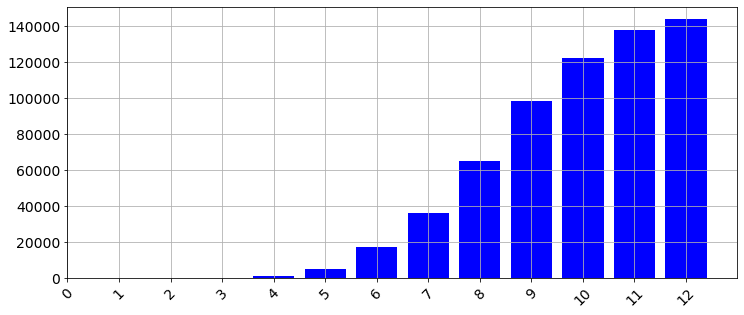

In [141]:
plot_var()

In [80]:
#ind=sample[sample['Country/Region']=='India']

In [174]:
def p(countries=['India','China','New Zealand']):
    plt.figure(figsize=(12,7))
    legends=[]
    for i in countries:
        y=sample[sample['Country/Region']==i]['Confirmed']
        x=sample[sample['Country/Region']==i]['month']
        legends.append(i)
        plt.plot(x,y,lw=2)
    plt.xlabel('Months')
    plt.ylabel('Growth of cases')
    plt.xlim(2,12,1)
    plt.ylim(0,1000000)
    plt.yticks(np.arange(0,1000000,100000))
    plt.legend(legends)
    plt.show()

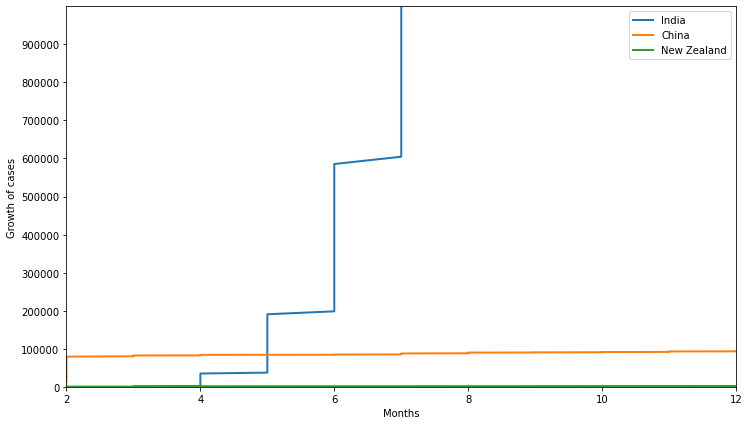

In [175]:
p()

In [182]:
s=sample.groupby(['month','Country/Region'])['Confirmed'].sum()
s

month  Country/Region    
1      Afghanistan                 0
       Albania                     0
       Algeria                     0
       Andorra                     0
       Angola                      0
                              ...   
12     Vietnam                 19257
       West Bank and Gaza    1404015
       Yemen                   30514
       Zambia                 251787
       Zimbabwe               151388
Name: Confirmed, Length: 2292, dtype: int64

In [200]:
s.iloc[1135:1150]

month  Country/Region      
6      United Arab Emirates    1274693
       United Kingdom          8213357
       Uruguay                   25962
       Uzbekistan               168606
       Vanuatu                       0
       Venezuela                101886
       Vietnam                   10196
       West Bank and Gaza        25938
       Yemen                     23264
       Zambia                    40038
       Zimbabwe                  12096
7      Afghanistan             1077247
       Albania                  119660
       Algeria                  674286
       Andorra                   27174
Name: Confirmed, dtype: int64

<BarContainer object of 328 artists>

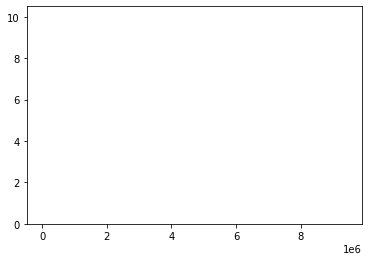

In [193]:
plt.bar(sample[sample['Country/Region']=='India']['Recovered'],height=10)

In [215]:
#fatality_ratio
def fatality_ratio(country):
    d=sample.iloc[-1]['Date']
    try:
        p = float(sample[(sample['Country/Region']==country) & (sample['Date']==d)]['Deaths'])
        t = float(sample[(sample['Country/Region']==country) & (sample['Date']==d)]['Confirmed'])
    except:
        print("Could not retrieve the necessary information")
        return -1
    
    if (p!=-1.0) and (t!=-1.0) and (t!=0):
        return round(p/t,3)
    else:
        return -1
    
    

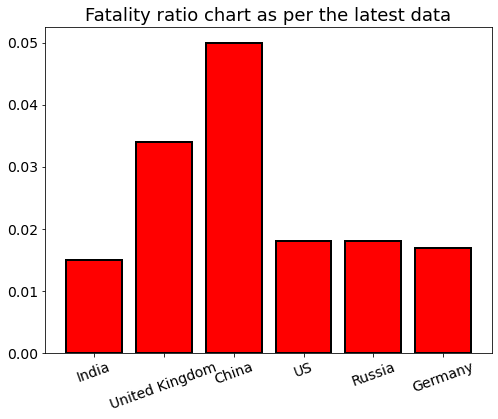

In [226]:
countries = ['India','United Kingdom','China','US','Russia','Germany']
fr,x = [],[]
for c in countries:
    data = fatality_ratio(c)
    if data!=-1:
        fr.append(data)
        x.append(c)

plt.figure(figsize=(8,6))
plt.title("Fatality ratio chart as per the latest data",fontsize=18)
plt.xticks(fontsize=14,rotation=20)
plt.yticks(fontsize=14)
plt.bar(x=x,height=fr,color='red',
        edgecolor='k',linewidth=2)
plt.show()

In [222]:
def recovery_ratio(country):
    d=sample.iloc[-1]['Date']
    try:
        p = float(sample[(sample['Country/Region']==country) & (sample['Date']==d)]['Recovered'])
        t = float(sample[(sample['Country/Region']==country) & (sample['Date']==d)]['Confirmed'])
    except:
        print("Could not retrieve the necessary information")
        return -1
    
    if (p!=-1.0) and (t!=-1.0) and (t!=0):
        return round(p/t,3)
    else:
        return -1

In [219]:
sample['Recovered']=sample['Confirmed']-sample['Active']-sample['Deaths']

ValueError: could not convert string to float: 'India'

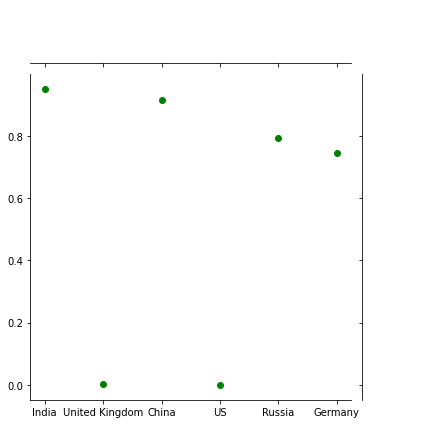

In [234]:
countries = ['India','United Kingdom','China','US','Russia','Germany']
rr,xx = [],[]
for c in countries:
    data = recovery_ratio(c)
    if data!=-1:
        rr.append(data)
        xx.append(c)

#plt.figure(figsize=(10,8))
#plt.title("Recovery ratio chart as per the latest data",fontsize=18)
#plt.xticks(fontsize=14,rotation=20)
#plt.yticks(fontsize=14)
g=sns.jointplot(x=xx,y=rr,color='green')
#plt.show()
g

In [233]:
sample[sample['Country/Region']=='United Kingdom']

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,month
181,2020-01-22,United Kingdom,0,0,0,0,1
372,2020-01-23,United Kingdom,0,0,0,0,1
563,2020-01-24,United Kingdom,0,0,0,0,1
754,2020-01-25,United Kingdom,0,0,0,0,1
945,2020-01-26,United Kingdom,0,0,0,0,1
...,...,...,...,...,...,...,...
61874,2020-12-10,United Kingdom,1792611,63179,3787,1725645,12
62065,2020-12-11,United Kingdom,1814395,63603,3799,1746993,12
62256,2020-12-12,United Kingdom,1835949,64123,3805,1768021,12
62447,2020-12-13,United Kingdom,1854490,64267,4013,1786210,12


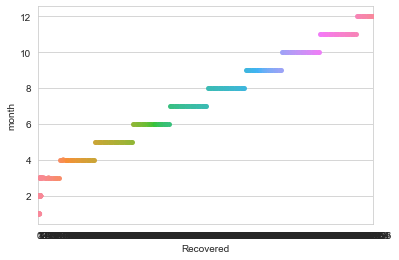

In [243]:
g=sns.swarmplot(y='month',x='Recovered',data=sample[sample['Country/Region']=='India'])
g

In [237]:
sns.set_style('whitegrid')

In [249]:
import cufflinks as cf
init_notebook_mode(connected=True)
cf.go_offline()
sample[['Confirmed','Deaths']].iplot(kind='spread')

In [268]:
d=sample.iloc[-1]['Date']
data=sample[sample['Date']=='2020-12-14']
data

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,month
62457,2020-12-14,Afghanistan,48718,1969,38252,8497,12
62458,2020-12-14,Albania,49191,1016,24820,23355,12
62459,2020-12-14,Algeria,92597,2609,60888,29100,12
62460,2020-12-14,Andorra,7382,79,6706,597,12
62461,2020-12-14,Angola,16277,372,8924,6981,12
...,...,...,...,...,...,...,...
62643,2020-12-14,Vietnam,1402,35,1246,121,12
62644,2020-12-14,West Bank and Gaza,111102,1000,87057,23045,12
62645,2020-12-14,Yemen,2084,606,1384,94,12
62646,2020-12-14,Zambia,18322,367,17409,546,12


In [269]:
data['CaseScale'] = np.log10(data['Confirmed'])

In [270]:
data.sample(10)

,Date,Country/Region,Confirmed,Deaths,Recovered,Active,month,CaseScale
62635,2020-12-14,Uganda,27766,224,9921,17621,12,4.443513
62548,2020-12-14,"Korea, South",44364,600,32559,11205,12,4.647031
62518,2020-12-14,Finland,31110,461,20000,10649,12,4.492900
62647,2020-12-14,Zimbabwe,11358,309,9554,1495,12,4.055302
62467,2020-12-14,Azerbaijan,178986,1966,114841,62179,12,5.252819
62636,2020-12-14,Ukraine,925321,15792,526101,383428,12,5.966292
62622,2020-12-14,Sweden,320098,7514,0,312584,12,5.505283
62600,2020-12-14,Saint Kitts and Nevis,28,0,23,5,12,1.447158
62580,2020-12-14,Netherlands,631910,10165,7779,613966,12,5.800655
62579,2020-12-14,Nepal,249244,1716,236573,10955,12,5.396625


In [275]:
sample['Country/Region'].values

191

TypeError: plot got an unexpected keyword argument 'x'

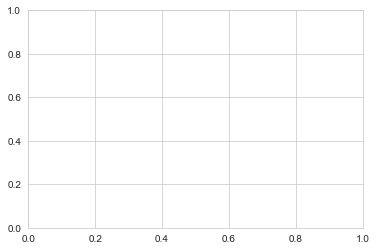

In [282]:
samplebydate 